### Эксперимент № 3

#### Label smoothing и больше эпох

1. Возьмем улучшения генератора из эксперимента № 1, а также learning rates из эксперимента № 2

2. Увеличим количество эпох до 10

3. Добавим label smoothing:

    * real label : 1 -> случайное число из равномерного распределения U([0.8, 1])
    * fake label : 0 -> случайное число из равномерного распределения U([0, 0.2])

In [1]:
from IPython.display import HTML
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
import matplotlib.animation as animation

In [2]:
writer = SummaryWriter('./dcgan_improved_exp3_loss')

# путь до изображений
image_path = './archive/img_align_celeba/'

# Количество воркеров для сборки датасета
workers = 2

# Количество каналов цвета
nc = 3

# размер изображения 
image_size = 64

# Рамер карты признаков для генератора
ngf = 64

# Рамер карты признаков для дискриминатора
ndf = 64

# размер батча
batch_size = 512

# размер латентного вектора
z_dim = 100

# Количество эпох
epochs_num = 10

# Шаг
lr = 0.0002
lr_g = lr
lr_d = lr * 0.5

# Параметр для оптимизатора Adam
beta1 = 0.5

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Active device: {device}")

Active device: cuda:0


In [4]:
dataset = datasets.ImageFolder(
    root=image_path,
    transform=transforms.Compose(
        [
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ]
    )
)

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

In [5]:
class CSPBlock(nn.Module):
    def __init__(self, in_channels):
        super(CSPBlock, self).__init__()
        self.seq1 = nn.Sequential(
            # nn.Conv2d(in_channels=in_channels // 2, out_channels=in_channels // 2, kernel_size=1, stride=1, padding=0, bias=False),
            # nn.BatchNorm2d(in_channels // 2),
            # nn.LeakyReLU(0.2, inplace=True),
            # nn.ConvTranspose2d(in_channels=in_channels // 2, out_channels=in_channels // 2, kernel_size=4, stride=2, padding=1, bias=False),
            # nn.BatchNorm2d(in_channels // 2),
            # nn.LeakyReLU(0.2, inplace=True),
            # nn.Conv2d(in_channels=in_channels // 2, out_channels=in_channels // 2, kernel_size=3, stride=1, padding=1, bias=False),
            # nn.BatchNorm2d(in_channels // 2),
            # nn.LeakyReLU(0.2, inplace=True),
            # nn.Conv2d(in_channels=in_channels // 2, out_channels=in_channels // 2, kernel_size=3, stride=1, padding=1, bias=False)
            nn.Conv2d(in_channels=in_channels // 2, out_channels=in_channels // 2, kernel_size=1, bias=False),
            nn.ReLU(inplace=True),
            # nn.ConvTranspose2d(in_channels=in_channels // 2, out_channels=in_channels // 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(in_channels=in_channels // 2, out_channels=in_channels // 2, kernel_size=3, padding=1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=in_channels // 2, out_channels=in_channels // 2, kernel_size=3, padding=1, bias=False)
        )

        self.seq2 = nn.Sequential(
            # nn.ConvTranspose2d(in_channels=in_channels // 2, out_channels=in_channels // 2, kernel_size=4, stride=2, padding=1, bias=False)
            nn.Upsample(scale_factor=2),
        )

        self.seq3 = nn.Sequential(
            nn.BatchNorm2d(in_channels // 2),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
    def forward(self, x):
        x1, x2 = torch.split(x, x.shape[1] // 2, dim=1)
        x1 = self.seq1(x1)
        x2 = self.seq2(x2)
        x_concat = self.seq3(x1 + x2)

        return x_concat

In [6]:
class Generator(nn.Module):
    def __init__(self, z_dim):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(in_channels=z_dim, out_channels=ngf * 16, kernel_size=4, stride=1, padding=0, bias=False),
            CSPBlock(in_channels=ngf * 16),
            CSPBlock(in_channels=ngf * 8),
            CSPBlock(in_channels=ngf * 4),
            CSPBlock(in_channels=ngf * 2),
            # CSPBlock(in_channels=ngf), закомментируем, чтобы был выход (batch_size, number_of_channels, 64, 64), а не (batch_size, number_of_channels, 128, 128)
            nn.ConvTranspose2d(in_channels=ngf, out_channels=nc, kernel_size=1, stride=1, padding=0, bias=False),
            nn.Tanh(),
        )

    def forward(self, input):
        return self.main(input)

In [7]:
# кастомная инициализация весов netG или netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [8]:
# Инициализируем генератор
netG = Generator(z_dim=z_dim).to(device)

# Инициализируем веса
netG.apply(weights_init)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): CSPBlock(
      (seq1): Sequential(
        (0): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): ReLU(inplace=True)
        (2): Upsample(scale_factor=2.0, mode='nearest')
        (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): ReLU(inplace=True)
        (5): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (seq2): Sequential(
        (0): Upsample(scale_factor=2.0, mode='nearest')
      )
      (seq3): Sequential(
        (0): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (1): LeakyReLU(negative_slope=0.2, inplace=True)
      )
    )
    (2): CSPBlock(
      (seq1): Sequential(
        (0): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): ReLU(inplace=True)
        (2): 

In [9]:
# Дискриминатор из ноутбука 

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [10]:
# инициализируем дискриминатор
netD = Discriminator().to(device)

# Инициализируем веса
netD.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [11]:
# Инициализируем лосс
criterion = nn.BCELoss()

# Создаем батч с рандомным шумом для генерации
fixed_noise = torch.randn(64, z_dim, 1, 1, device=device)

# Устанавливаем оптимизаторы для G и D
optimizerD = optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))

In [12]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# Для каждой эпохи
for epoch in range(epochs_num):
    # Для каждого батча
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Учим дискриминатор: максимизируем log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Для батча
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), torch.FloatTensor(1).uniform_(0.8, 1).item(), dtype=torch.float, device=device)
        # Прямой прогон батча из реальных картинок D
        output = netD(real_cpu).view(-1)
        # Считаем лосс на всем батче реальных картинок
        errD_real = criterion(output, label)
        # Вычисляем градиенты для дискриминатора
        errD_real.backward()
        D_x = output.mean().item()

        ## Учим на полном фейковом батче
        # Генерируем бат латентных векторов
        noise = torch.randn(b_size, z_dim, 1, 1, device=device)
        # Генерируем фековый батч с помощью G
        fake = netG(noise)
        label.fill_(torch.FloatTensor(1).uniform_(0.0, 0.2).item())
        # Классифицируем фековый батч с помощью D
        output = netD(fake.detach()).view(-1)
        # Вычисляем лосс дискриминатора на фейковом батче
        errD_fake = criterion(output, label)
        # Вычисляем градиент для фейкового батча, он суммируется с предидущим
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Вычисляем ошибку на реальном и фековом батчах
        errD = errD_real + errD_fake
        # Обновляем веса D
        optimizerD.step()

        ############################
        # (2) Учим генератор: максимизируем log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(torch.FloatTensor(1).uniform_(0.8, 1).item())  # для генератора фейковые метки есть реальные (0 меняем на 1)
        # Так как мы обновили веса дискриминатора прогоним фековый батч через него еще  раз
        output = netD(fake).view(-1)
        # Вычислим лосс G основываясь на выходе D
        errG = criterion(output, label)
        # Вычислим градиент для G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Обновляем веса G
        optimizerG.step()

        # Выводим статистику обучения
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, epochs_num, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Сохраним лоссы
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        writer.add_scalar('generator loss', errG.item(), iters)
        writer.add_scalar('discriminator loss', errD.item(), iters)

        # Проверим какие картинки рисует генератор
        if (iters % 500 == 0) or ((epoch == epochs_num-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

writer.flush()

Starting Training Loop...


[0/10][0/396]	Loss_D: 2.0125	Loss_G: 0.9000	D(x): 0.4300	D(G(z)): 0.5893 / 0.4537
[0/10][50/396]	Loss_D: 0.7624	Loss_G: 4.8258	D(x): 0.8851	D(G(z)): 0.3047 / 0.0098
[0/10][100/396]	Loss_D: 1.3057	Loss_G: 2.8652	D(x): 0.6728	D(G(z)): 0.4155 / 0.0815
[0/10][150/396]	Loss_D: 1.4481	Loss_G: 1.8232	D(x): 0.4632	D(G(z)): 0.1178 / 0.1645
[0/10][200/396]	Loss_D: 1.0572	Loss_G: 3.0381	D(x): 0.6565	D(G(z)): 0.3297 / 0.0625
[0/10][250/396]	Loss_D: 1.3594	Loss_G: 1.8893	D(x): 0.5959	D(G(z)): 0.3744 / 0.1528
[0/10][300/396]	Loss_D: 1.1232	Loss_G: 2.5693	D(x): 0.6145	D(G(z)): 0.3292 / 0.0853
[0/10][350/396]	Loss_D: 1.5008	Loss_G: 2.0123	D(x): 0.7058	D(G(z)): 0.6065 / 0.1691
[1/10][0/396]	Loss_D: 1.3860	Loss_G: 1.1018	D(x): 0.5198	D(G(z)): 0.3668 / 0.3540
[1/10][50/396]	Loss_D: 1.4003	Loss_G: 1.5627	D(x): 0.5179	D(G(z)): 0.3805 / 0.1791
[1/10][100/396]	Loss_D: 1.5473	Loss_G: 1.9497	D(x): 0.7271	D(G(z)): 0.6604 / 0.1315
[1/10][150/396]	Loss_D: 1.4510	Loss_G: 1.7964	D(x): 0.6485	D(G(z)): 0.5539 / 0.173

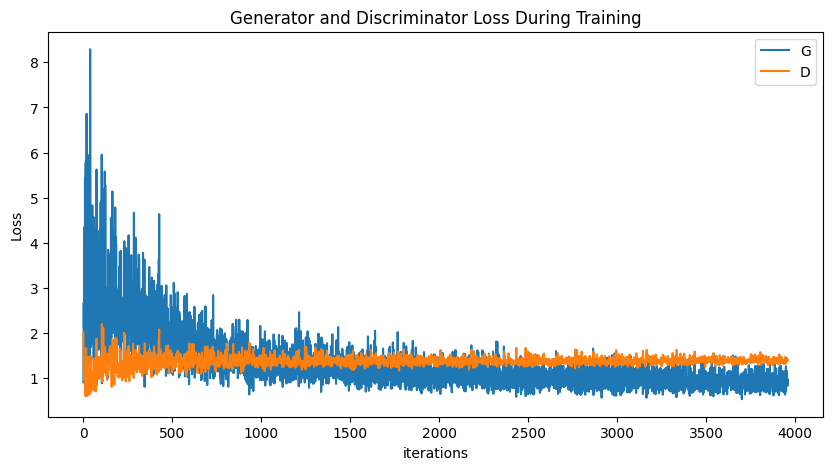

In [13]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Наблюдаем похожую с 2 экспериментом картину сходимости, но сейчас по сравнению с 2 экспериментом скачок лосса генератора был не таким сильным.

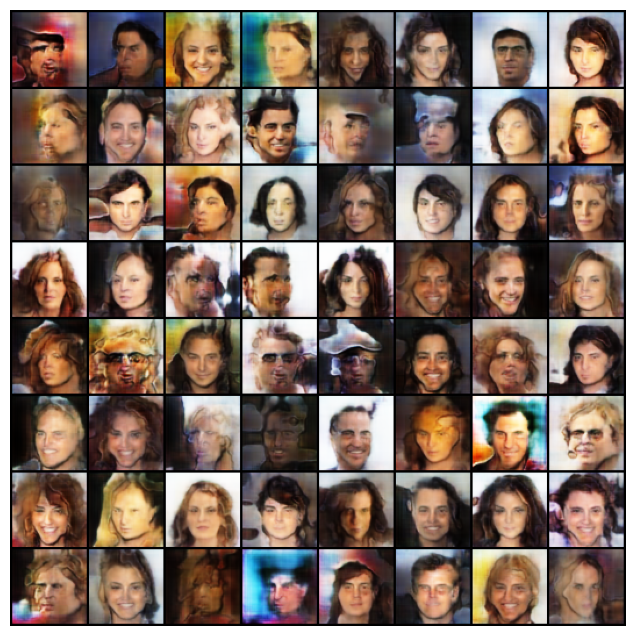

In [14]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

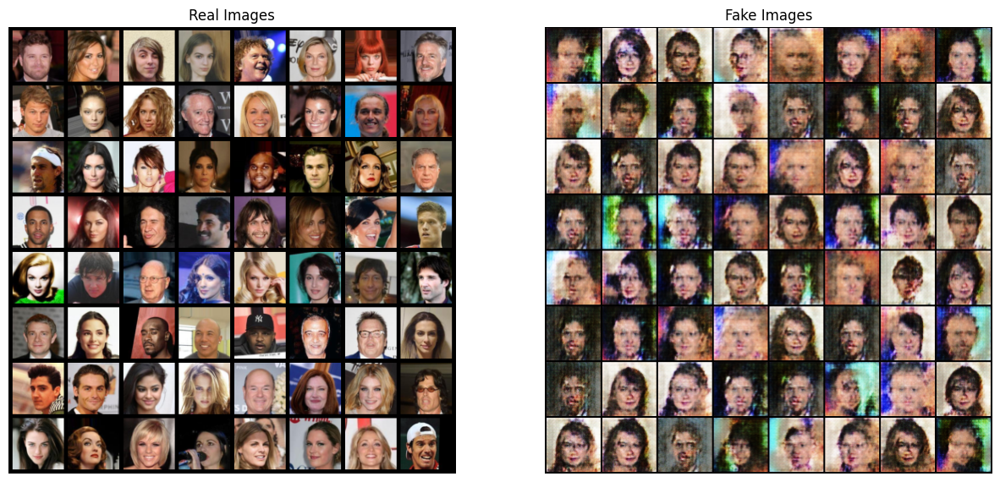

In [16]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

Сгенерированные изображения стали более разнообразными, но так и остались плохо детализированными.